In [ ]:
#MSBA 503 Take-Home Assignment

#This assignment requires more effort than the in-class assignments. You may seek help from
#your peer(s) for the review purpose. If you do that, mention it in an acknowledgment section. It
#will not impact your grade. However, you cannot submit others’ work or work jointly with
#someone. This assignment has two parts. Your final deliverable will be a Word document. See
#below for more instructions.

#Part A

#(i) Use two or more deep learning algorithms from the computer vision area to extract
#objects from a series of images and compare their performance in terms of time,
#objects detected, and probabilities. You can choose 5 or 10 images of your own and
#record these outputs for each of them. In the end, those outcomes will be presented
#in a tabular format. 10 points

#(ii) Can you extract anything else from these images with or without using deep learning
#algorithms? 4 points
#Your Word document will have the comparison table and your comments on it. Do not write
#more than 2-3 sentences. Also, describe (ii) in the Word document with similar sentence
#limitations regarding what you did and the outcomes.

#Part B

#Upload the code to GitHub, create a nice Read Me file, and attach the link to the Word
#document. Make sure the code in GitHub is well-commented. You do not need to upload the
#images on GitHub. The coding file should have the code and outputs printed. 6 points


In [43]:
%matplotlib inline

In [12]:
from google.colab import drive

# This will prompt you to authenticate and provide access to your Drive
drive.mount('/content/drive')

# Path to the ZIP file in your Drive
zip_path = '/content/drive/MyDrive/images_for_python.zip'

# Extract the ZIP file
import zipfile
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('images')  # Extract into a folder named 'images'

Mounted at /content/drive


In [13]:
# Path to the ZIP file in Google Drive
zip_path = '/content/drive/MyDrive/images_for_python.zip'  # Adjust the path if necessary

# Extract the ZIP file
import zipfile
import os

# Define the extraction folder
extract_folder = '/content/images'

# Extract the ZIP file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder)

# Verify extraction
print("Extracted files:", os.listdir(extract_folder))


Extracted files: ['images_for_python', '__MACOSX']


In [18]:
import os

# List files in the 'images_for_python' subdirectory
subdir_path = os.path.join(extract_folder, 'images_for_python')
print("Files in 'images_for_python' folder:", os.listdir(subdir_path))


Files in 'images_for_python' folder: ['dumbledore.jpeg', "Ron's family.jpeg", 'Pr. Snape.jpeg', 'WizardsChess.jpeg', 'Harry Potter Christmas Tree.jpeg']


In [22]:
# Correct paths to point to the actual subdirectory
image_paths = [
    '/content/images/images_for_python/dumbledore.jpeg',
    '/content/images/images_for_python/WizardsChess.jpeg',
    '/content/images/images_for_python/Pr. Snape.jpeg',
    "/content/images/images_for_python/Ron's family.jpeg",
    '/content/images/images_for_python/Harry Potter Christmas Tree.jpeg'
]

# Verify the updated paths
for image_path in image_paths:
    if os.path.exists(image_path):
        print(f"Found: {image_path}")
    else:
        print(f"Missing: {image_path}")


Found: /content/images/images_for_python/dumbledore.jpeg
Found: /content/images/images_for_python/WizardsChess.jpeg
Found: /content/images/images_for_python/Pr. Snape.jpeg
Found: /content/images/images_for_python/Ron's family.jpeg
Found: /content/images/images_for_python/Harry Potter Christmas Tree.jpeg


In [27]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)


In [30]:
import torch
import time
import pandas as pd
from PIL import Image

# Load YOLOv5 model
yolo_model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # YOLOv5 small model

# Store results
results_yolo = []

# Perform object detection with YOLOv5
for image_path in image_paths:
    # Load image
    image = Image.open(image_path)

    # Start timer
    start_time = time.time()

    # Perform detection
    results = yolo_model(image)

    # End timer
    end_time = time.time()

    # Parse results
    detections = results.pandas().xyxy[0]  # Pandas DataFrame of results
    num_objects = len(detections)
    confidences = detections['confidence'].tolist()

    # Append to results
    results_yolo.append({
        'image': image_path.split('/')[-1],
        'num_objects': num_objects,
        'confidences': confidences,
        'detection_time': end_time - start_time
    })

# Convert results to DataFrame
results_yolo_df = pd.DataFrame(results_yolo)

# Display YOLOv5 results
print("YOLOv5 Object Detection Results:")
print(results_yolo_df)

# Optionally, save the results to a CSV file
results_yolo_df.to_csv('/content/yolov5_results.csv', index=False)
print("Results saved to yolov5_results.csv")

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-12-7 Python-3.10.12 torch-2.5.1+cu121 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


YOLOv5 Object Detection Results:
                              image  num_objects  \
0                   dumbledore.jpeg           15   
1                 WizardsChess.jpeg           15   
2                    Pr. Snape.jpeg            9   
3                 Ron's family.jpeg           15   
4  Harry Potter Christmas Tree.jpeg            8   

                                         confidences  detection_time  
0  [0.874815821647644, 0.6609790325164795, 0.5736...        0.344790  
1  [0.9315154552459717, 0.9237744212150574, 0.845...        0.324994  
2  [0.8790254592895508, 0.8251825571060181, 0.784...        0.356626  
3  [0.7907288074493408, 0.707407534122467, 0.7041...        0.302994  
4  [0.6062424182891846, 0.4434964656829834, 0.433...        0.405396  
Results saved to yolov5_results.csv


Processing image: /content/images/images_for_python/dumbledore.jpeg

image 1/1 /content/images/images_for_python/dumbledore.jpeg: 416x640 2 persons, 2 birds, 1 tie, 2 chairs, 1 laptop, 9 books, 1722.2ms
Speed: 5.0ms preprocess, 1722.2ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)


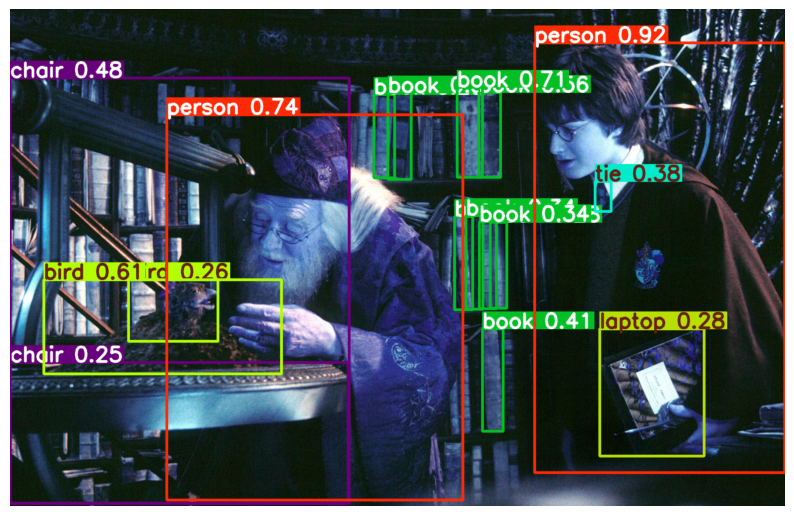

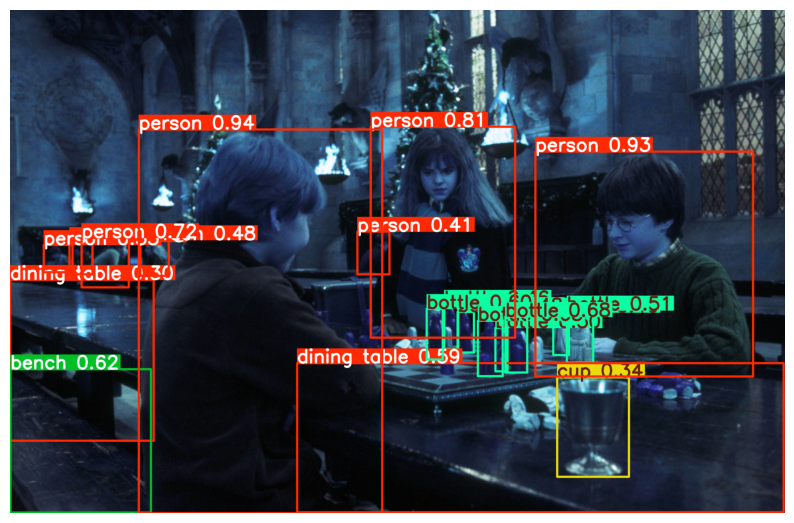

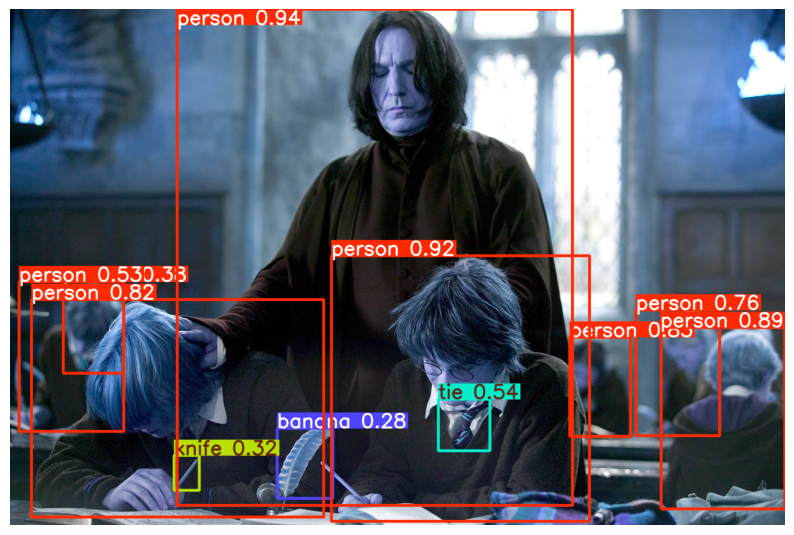

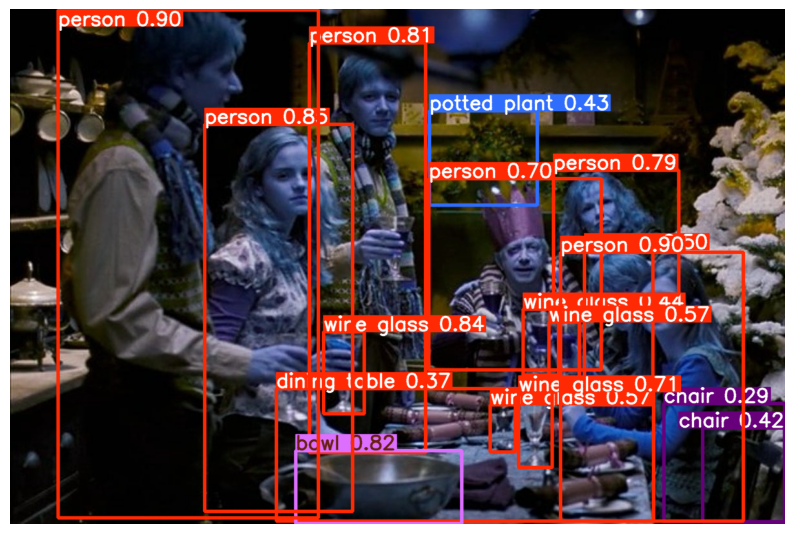

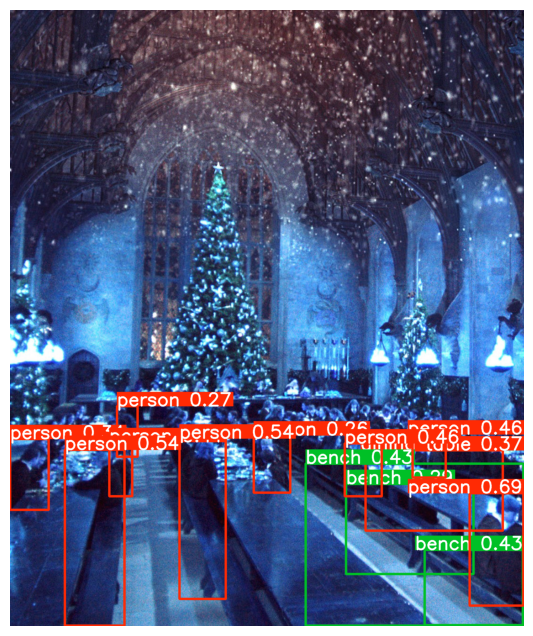

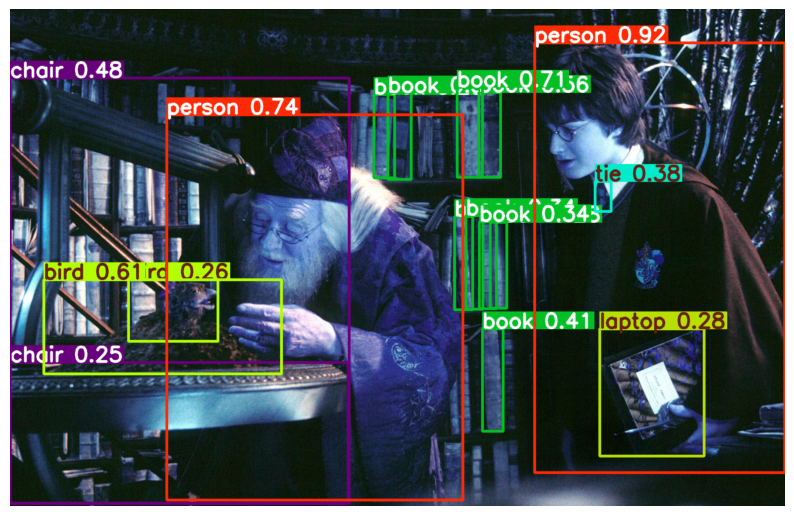

Annotated image saved to /content/images/images_for_python/dumbledore_annotated.jpeg
Processing image: /content/images/images_for_python/WizardsChess.jpeg

image 1/1 /content/images/images_for_python/WizardsChess.jpeg: 416x640 8 persons, 1 bench, 8 bottles, 1 cup, 2 dining tables, 1239.7ms
Speed: 4.5ms preprocess, 1239.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


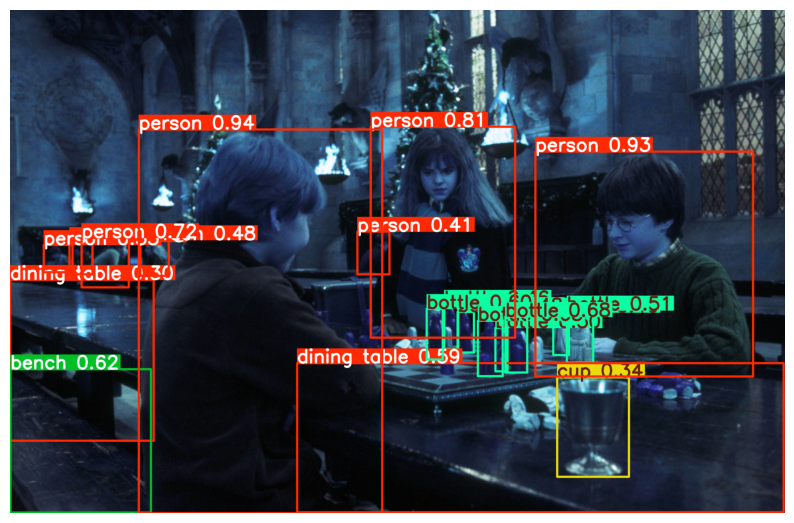

Annotated image saved to /content/images/images_for_python/WizardsChess_annotated.jpeg
Processing image: /content/images/images_for_python/Pr. Snape.jpeg

image 1/1 /content/images/images_for_python/Pr. Snape.jpeg: 448x640 8 persons, 1 tie, 1 knife, 1 banana, 1312.6ms
Speed: 5.3ms preprocess, 1312.6ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


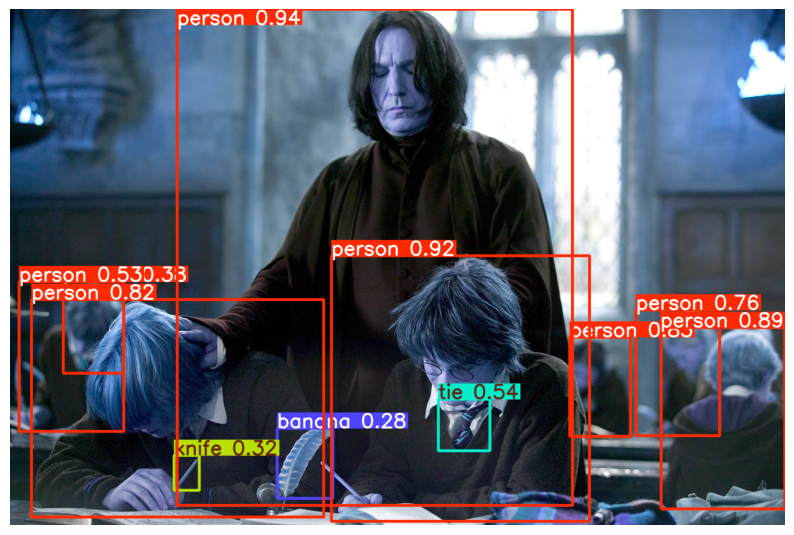

Annotated image saved to /content/images/images_for_python/Pr. Snape_annotated.jpeg
Processing image: /content/images/images_for_python/Ron's family.jpeg

image 1/1 /content/images/images_for_python/Ron's family.jpeg: 448x640 7 persons, 5 wine glasss, 1 bowl, 2 chairs, 1 potted plant, 1 dining table, 1316.1ms
Speed: 4.9ms preprocess, 1316.1ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)


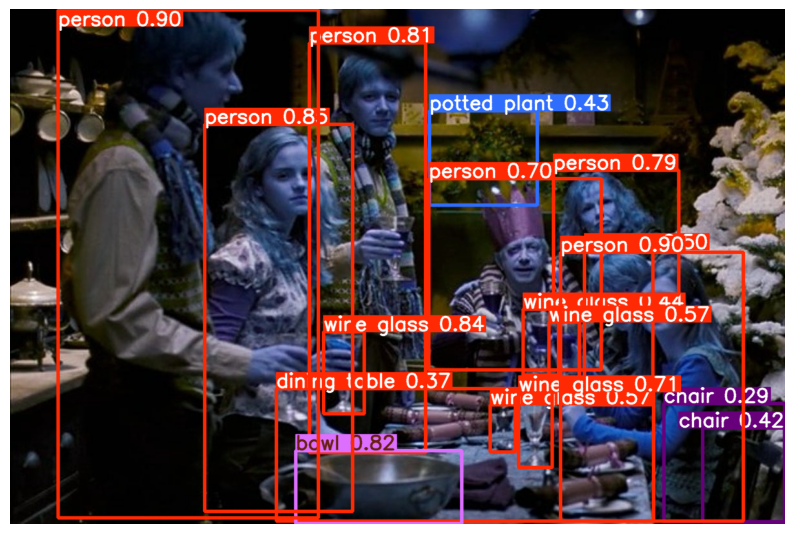

Annotated image saved to /content/images/images_for_python/Ron's family_annotated.jpeg
Processing image: /content/images/images_for_python/Harry Potter Christmas Tree.jpeg

image 1/1 /content/images/images_for_python/Harry Potter Christmas Tree.jpeg: 640x544 9 persons, 3 benchs, 1 dining table, 1843.4ms
Speed: 10.6ms preprocess, 1843.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 544)


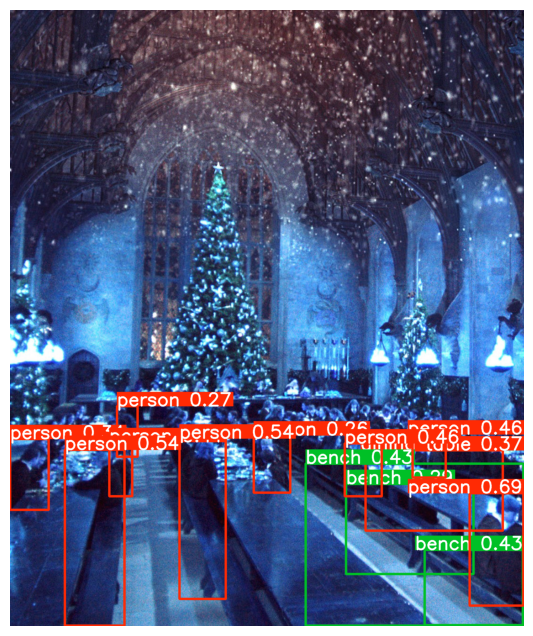

Annotated image saved to /content/images/images_for_python/Harry Potter Christmas Tree_annotated.jpeg


In [44]:
# Import necessary libraries
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt

# Load the YOLOv8 model
model = YOLO("yolov8m.pt")  # Use the YOLOv8 medium model; you can adjust as needed

# List of images for detection
image_paths = [
    '/content/images/images_for_python/dumbledore.jpeg',
    '/content/images/images_for_python/WizardsChess.jpeg',
    '/content/images/images_for_python/Pr. Snape.jpeg',
    '/content/images/images_for_python/Ron\'s family.jpeg',
    '/content/images/images_for_python/Harry Potter Christmas Tree.jpeg'
]

# Loop through each image, perform detection, display, and save results
for image_path in image_paths:
    print(f"Processing image: {image_path}")

    # Perform detection
    results = model.predict(image_path)  # Returns an array with results; here, only one image at a time
    result = results[0]  # Get the first result (for a single image)

    # Display the annotated image inline
    annotated_image = result.plot()  # Draw bounding boxes and labels on the image
    plt.figure(figsize=(10, 8))
    plt.imshow(annotated_image)
    plt.axis('off')  # Turn off the axes for better visualization
    plt.show()  # Ensure the plot is displayed inline

    # Save the annotated image
    annotated_image_pil = Image.fromarray(annotated_image)
    save_path = image_path.replace('.jpeg', '_annotated.jpeg')
    annotated_image_pil.save(save_path)
    print(f"Annotated image saved to {save_path}")


In [45]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F
from PIL import Image
import time

# Load Faster R-CNN pre-trained model
faster_rcnn_model = fasterrcnn_resnet50_fpn(pretrained=True)
faster_rcnn_model.eval()

# Transform for input images
def transform_image(image):
    return F.to_tensor(image).unsqueeze(0)

# Perform object detection with Faster R-CNN
faster_rcnn_results = []
for image_path in image_paths:
    print(f"Processing image: {image_path}")

    # Load and transform the image
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform_image(image)

    # Start timer
    start_time = time.time()

    # Perform detection
    with torch.no_grad():
        outputs = faster_rcnn_model(input_tensor)

    # End timer
    end_time = time.time()

    # Extract results
    detections = outputs[0]
    num_objects = len(detections["labels"])
    confidences = detections["scores"].tolist()

    # Append results
    faster_rcnn_results.append({
        "image": image_path.split("/")[-1],
        "num_objects": num_objects,
        "confidences": confidences,
        "detection_time": end_time - start_time
    })

    print(f"Detected {num_objects} objects in {end_time - start_time:.2f} seconds")

# Convert Faster R-CNN results to DataFrame
import pandas as pd
faster_rcnn_df = pd.DataFrame(faster_rcnn_results)


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:03<00:00, 53.8MB/s]


Processing image: /content/images/images_for_python/dumbledore.jpeg
Detected 98 objects in 12.37 seconds
Processing image: /content/images/images_for_python/WizardsChess.jpeg
Detected 88 objects in 11.98 seconds
Processing image: /content/images/images_for_python/Pr. Snape.jpeg
Detected 57 objects in 14.70 seconds
Processing image: /content/images/images_for_python/Ron's family.jpeg
Detected 91 objects in 10.34 seconds
Processing image: /content/images/images_for_python/Harry Potter Christmas Tree.jpeg
Detected 100 objects in 10.44 seconds


Processing image: /content/images/images_for_python/dumbledore.jpeg


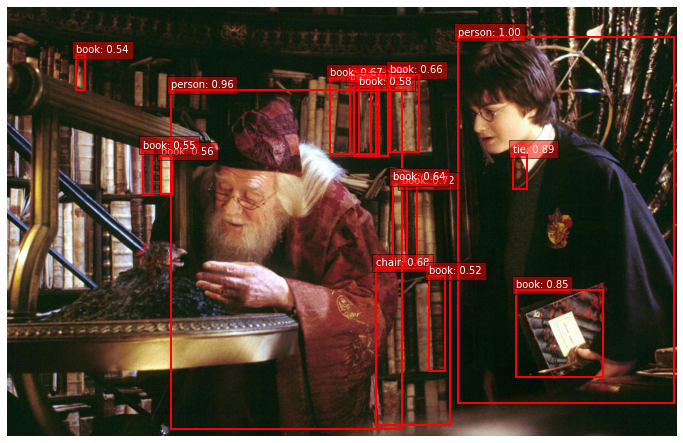

Processing image: /content/images/images_for_python/WizardsChess.jpeg


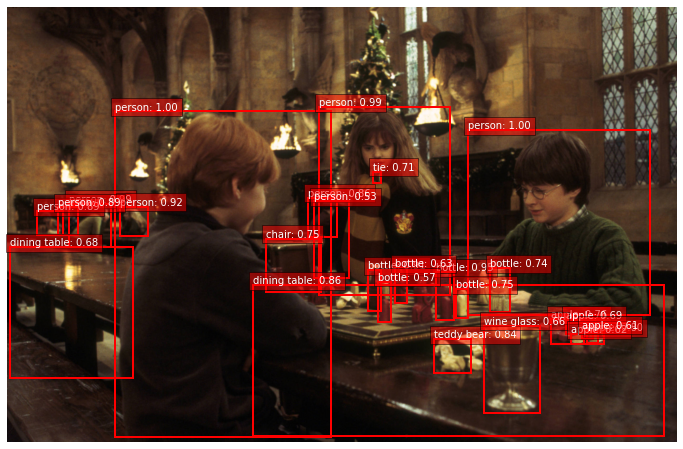

Processing image: /content/images/images_for_python/Pr. Snape.jpeg


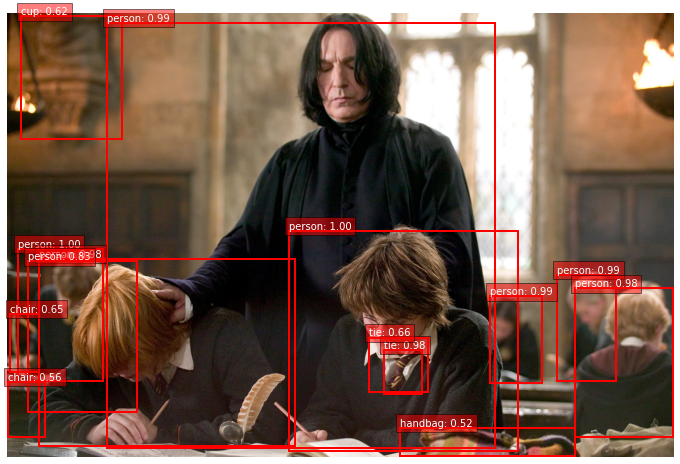

Processing image: /content/images/images_for_python/Ron's family.jpeg


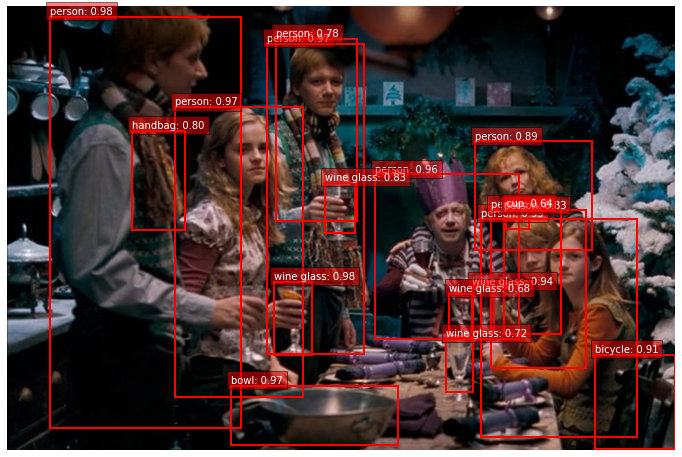

Processing image: /content/images/images_for_python/Harry Potter Christmas Tree.jpeg


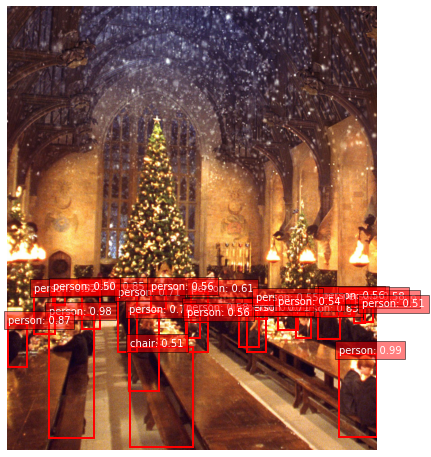

In [46]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.transforms import functional as F
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Step 1: Load the pre-trained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

# COCO class labels (you can use a COCO_CLASSES dictionary if required)
COCO_CLASSES = {
    1: 'person', 2: 'bicycle', 3: 'car', 4: 'motorcycle', 5: 'airplane', 6: 'bus',
    7: 'train', 8: 'truck', 9: 'boat', 10: 'traffic light', 11: 'fire hydrant',
    13: 'stop sign', 14: 'parking meter', 15: 'bench', 16: 'bird', 17: 'cat',
    18: 'dog', 19: 'horse', 20: 'sheep', 21: 'cow', 22: 'elephant', 23: 'bear',
    24: 'zebra', 25: 'giraffe', 27: 'backpack', 28: 'umbrella', 31: 'handbag',
    32: 'tie', 33: 'suitcase', 34: 'frisbee', 35: 'skis', 36: 'snowboard',
    37: 'sports ball', 38: 'kite', 39: 'baseball bat', 40: 'baseball glove',
    41: 'skateboard', 42: 'surfboard', 43: 'tennis racket', 44: 'bottle',
    46: 'wine glass', 47: 'cup', 48: 'fork', 49: 'knife', 50: 'spoon', 51: 'bowl',
    52: 'banana', 53: 'apple', 54: 'sandwich', 55: 'orange', 56: 'broccoli',
    57: 'carrot', 58: 'hot dog', 59: 'pizza', 60: 'donut', 61: 'cake',
    62: 'chair', 63: 'couch', 64: 'potted plant', 65: 'bed', 67: 'dining table',
    70: 'toilet', 72: 'tv', 73: 'laptop', 74: 'mouse', 75: 'remote', 76: 'keyboard',
    77: 'cell phone', 78: 'microwave', 79: 'oven', 80: 'toaster', 81: 'sink',
    82: 'refrigerator', 84: 'book', 85: 'clock', 86: 'vase', 87: 'scissors',
    88: 'teddy bear', 89: 'hair drier', 90: 'toothbrush'
}

# List of images for detection
image_paths = [
    '/content/images/images_for_python/dumbledore.jpeg',
    '/content/images/images_for_python/WizardsChess.jpeg',
    '/content/images/images_for_python/Pr. Snape.jpeg',
    '/content/images/images_for_python/Ron\'s family.jpeg',
    '/content/images/images_for_python/Harry Potter Christmas Tree.jpeg'
]

# Confidence threshold
confidence_threshold = 0.5

# Loop through each image, perform detection, and display results
for image_path in image_paths:
    print(f"Processing image: {image_path}")

    # Step 2: Load the image
    image = Image.open(image_path).convert("RGB")
    image_tensor = F.to_tensor(image)  # Convert image to tensor

    # Step 3: Perform object detection
    with torch.no_grad():
        predictions = model([image_tensor])

    # Step 4: Extract predictions
    predicted_boxes = predictions[0]['boxes']  # Bounding boxes
    predicted_scores = predictions[0]['scores']  # Confidence scores
    predicted_labels = predictions[0]['labels']  # Class indices

    # Filter predictions by confidence threshold
    filtered_boxes = []
    filtered_scores = []
    filtered_labels = []

    for box, score, label in zip(predicted_boxes, predicted_scores, predicted_labels):
        if score >= confidence_threshold:
            filtered_boxes.append(box)
            filtered_scores.append(score)
            filtered_labels.append(label)

    # Step 5: Annotate the image with bounding boxes and class names
    fig, ax = plt.subplots(1, figsize=(12, 8), dpi=72)  # Set the figure size and resolution
    ax.imshow(image)

    for box, score, label in zip(filtered_boxes, filtered_scores, filtered_labels):
        x_min, y_min, x_max, y_max = box.tolist()
        class_name = COCO_CLASSES[label.item()]  # Map label to class name

        # Draw the bounding box
        rect = patches.Rectangle(
            (x_min, y_min),
            x_max - x_min,
            y_max - y_min,
            linewidth=2,
            edgecolor='red',
            facecolor='none'
        )
        ax.add_patch(rect)

        # Add the class name and score as text
        ax.text(
            x_min,
            y_min - 5,
            f"{class_name}: {score:.2f}",
            color='white',
            fontsize=10,
            bbox=dict(facecolor='red', alpha=0.5)
        )

    plt.axis("off")  # Hide axes for better visualization
    plt.show()


In [47]:
# Combine YOLOv8 and Faster R-CNN results for comparison
yolo_df = results_yolo_df.rename(columns={"num_objects": "YOLO_Num_Objects", "detection_time": "YOLO_Time"})
faster_rcnn_df = faster_rcnn_df.rename(columns={"num_objects": "FRCNN_Num_Objects", "detection_time": "FRCNN_Time"})

# Merge DataFrames
comparison_df = yolo_df[["image", "YOLO_Num_Objects", "YOLO_Time"]].merge(
    faster_rcnn_df[["image", "FRCNN_Num_Objects", "FRCNN_Time"]], on="image"
)

# Display Comparison Table
print("Comparison Table:")
print(comparison_df)
comparison_df.to_csv("/content/comparison_table.csv", index=False)


Comparison Table:
                              image  YOLO_Num_Objects  YOLO_Time  \
0                   dumbledore.jpeg                15   0.344790   
1                 WizardsChess.jpeg                15   0.324994   
2                    Pr. Snape.jpeg                 9   0.356626   
3                 Ron's family.jpeg                15   0.302994   
4  Harry Potter Christmas Tree.jpeg                 8   0.405396   

   FRCNN_Num_Objects  FRCNN_Time  
0                 98   12.365535  
1                 88   11.977804  
2                 57   14.695153  
3                 91   10.335747  
4                100   10.440122  


Processing additional features for: /content/images/images_for_python/dumbledore.jpeg


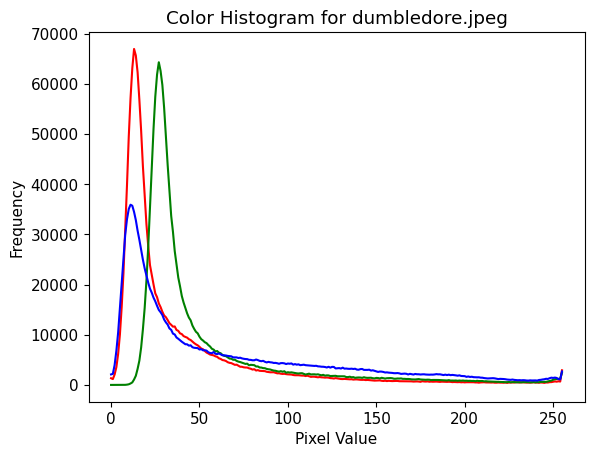

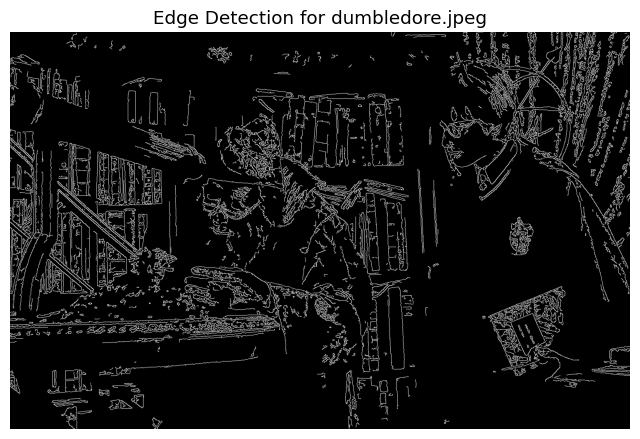

Processing additional features for: /content/images/images_for_python/WizardsChess.jpeg


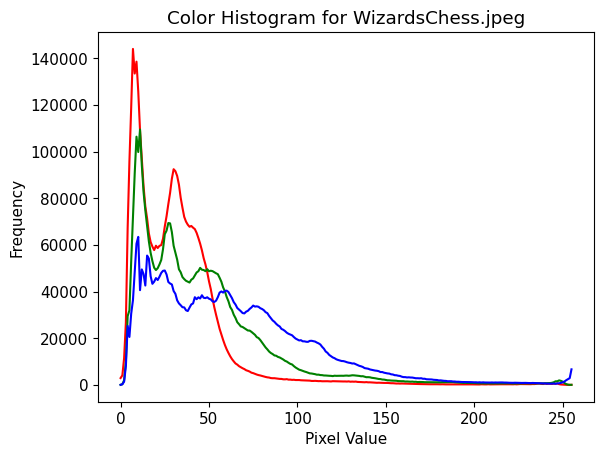

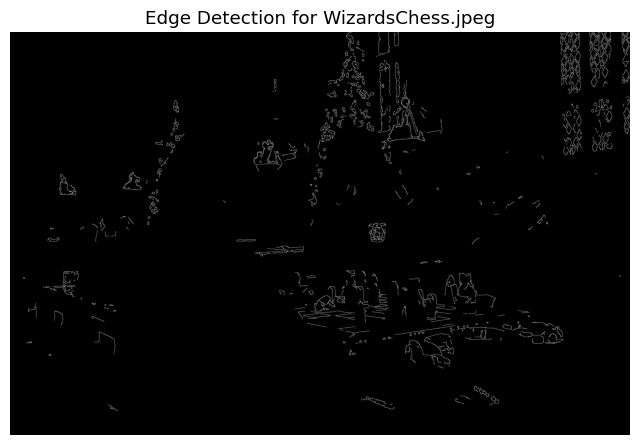

Processing additional features for: /content/images/images_for_python/Pr. Snape.jpeg


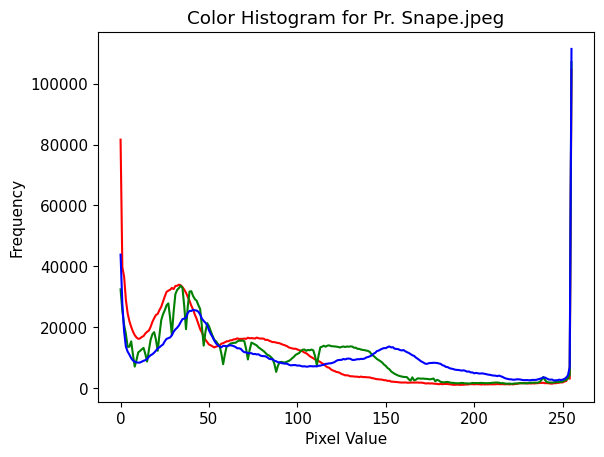

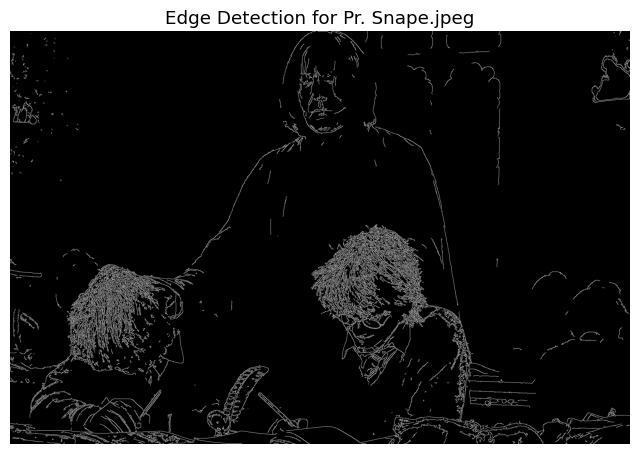

Processing additional features for: /content/images/images_for_python/Ron's family.jpeg


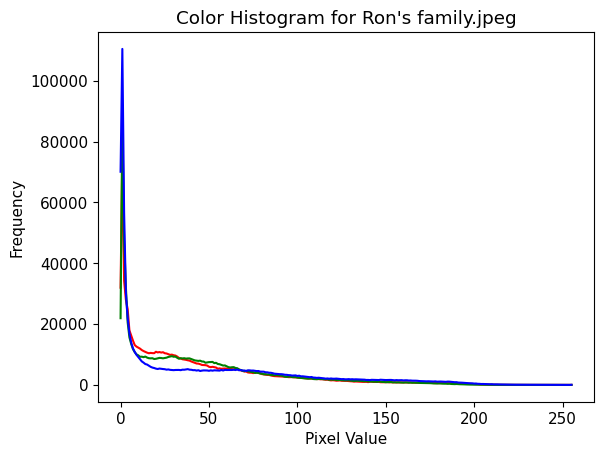

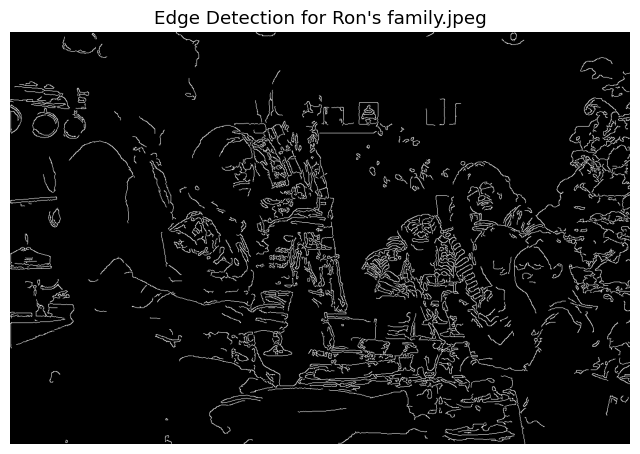

Processing additional features for: /content/images/images_for_python/Harry Potter Christmas Tree.jpeg


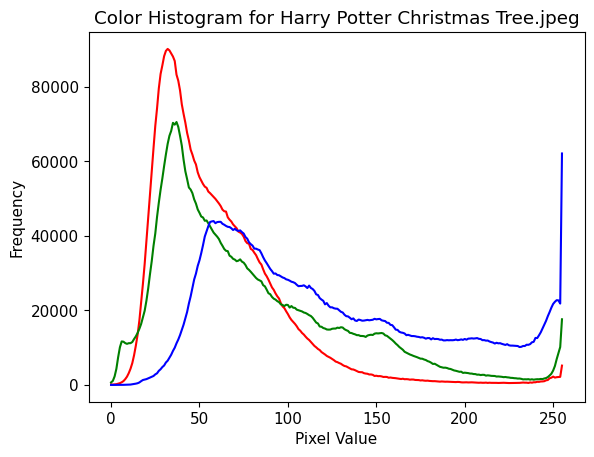

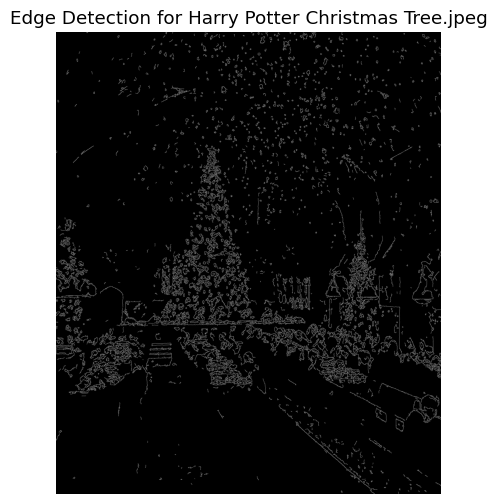

In [48]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Additional feature extraction: Color Histogram and Edge Detection
for image_path in image_paths:
    print(f"Processing additional features for: {image_path}")

    # Load the image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization

    # Extract color histogram
    color_hist = []
    for channel, color in enumerate(['r', 'g', 'b']):
        hist = cv2.calcHist([image], [channel], None, [256], [0, 256])
        color_hist.append(hist)
        plt.plot(hist, color=color)

    plt.title(f"Color Histogram for {image_path.split('/')[-1]}")
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")
    plt.show()

    # Perform edge detection
    edges = cv2.Canny(image, 100, 200)
    plt.figure(figsize=(8, 6))
    plt.imshow(edges, cmap='gray')
    plt.title(f"Edge Detection for {image_path.split('/')[-1]}")
    plt.axis('off')
    plt.show()


In [25]:
from google.colab import files
files.download('/content/yolov5_results.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>